###################NATURAL LANGUAGE PROCESSING#########################

################Hotel_reviews.csv###############


In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [ ]:
cd /content/drive/MyDrive

/content/drive/MyDrive


In [ ]:
from google.colab import files
uploaded=files.upload()

Saving hotel_reviews.csv to hotel_reviews (1).csv


In [ ]:
ls

 32120.jpg                   IMG_20180902_181534.jpg
'Anguli vds'/                IMG_20180902_181654.jpg
 Certificates/               IMG_20180902_181756.jpg
'class 8 text book.pdf'      IMG_20180902_181805.jpg
 CLF_pickle                  IMG_20180902_181816.jpg
'Colab Notebooks'/           IMG_20180902_181821.jpg
 contacts.vcf                IMG_20180902_181827.jpg
'cv nw sruthi tvm BED.doc'   IMG_20180902_181840.jpg
'hotel_reviews (1).csv'      IMG_20180902_181843.jpg
 hotel_reviews.csv           IMG_20180902_181916.jpg
 IMG_20180902_164302.jpg     JohnyTalkers.mtw.gsheet
 IMG_20180902_171111.jpg    'ML PROJECT'/
 IMG_20180902_171140.jpg    'My pics'/
 IMG_20180902_171201.jpg    'New Doc 2019-09-10 11.04.00.pdf'
 IMG_20180902_181130.jpg    'Pdf docs'/
 IMG_20180902_181132.jpg    'Personal pics'/
 IMG_20180902_181143.jpg     PrintIII.pdf
 IMG_20180902_181159.jpg     sbc3.mp4
 IMG_20180902_181200.jpg     Signature.jpg
 IMG_20180902_181214.jpg    'SRUTHI VIROLOGY.xps'
 IMG_20180902_18

In [ ]:
###IMPORT LIBRARIES
import pandas as pd
import numpy as np
import string  #special operations on string
import spacy  #language models
import nltk

In [ ]:
reviews=pd.read_csv("hotel_reviews.csv")

In [ ]:
reviews.head(10)

,Review,Rating
0,nice hotel expensive parking got good deal sta...,4
1,ok nothing special charge diamond member hilto...,2
2,nice rooms not 4* experience hotel monaco seat...,3
3,"unique, great stay, wonderful time hotel monac...",5
4,"great stay great stay, went seahawk game aweso...",5
5,love monaco staff husband stayed hotel crazy w...,5
6,"cozy stay rainy city, husband spent 7 nights m...",5
7,"excellent staff, housekeeping quality hotel ch...",4
8,"hotel stayed hotel monaco cruise, rooms genero...",5
9,excellent stayed hotel monaco past w/e delight...,5


In [ ]:
reviews.tail(10)

,Review,Rating
20481,ok price look hotel ok little run average clea...,2
20482,great choice wife chose best western quite bit...,5
20483,good bed clean convenient just night happy sta...,4
20484,deceptive staff deceptive desk staff claiming ...,2
20485,not impressed unfriendly staff checked asked h...,2
20486,"best kept secret 3rd time staying charm, not 5...",5
20487,great location price view hotel great quick pl...,4
20488,"ok just looks nice modern outside, desk staff ...",2
20489,hotel theft ruined vacation hotel opened sept ...,1
20490,"people talking, ca n't believe excellent ratin...",2


In [ ]:
reviews.shape

(20491, 2)

In [ ]:
reviews.columns

Index(['Review', 'Rating'], dtype='object')

In [ ]:
reviews.isna().sum()

Review    0
Rating    0
dtype: int64

In [ ]:
reviews.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20491 entries, 0 to 20490
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Review  20491 non-null  object
 1   Rating  20491 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 320.3+ KB


##########Descriptive statistics

In [ ]:
reviews.describe()

,Rating
count,20491.000000
mean,3.952223
std,1.233030
min,1.000000
25%,3.000000
50%,4.000000
75%,5.000000
max,5.000000


#################### to get unique values in Rating Column

In [ ]:
reviews.Rating.unique()

array([4, 2, 3, 5, 1])

################## to get the count of occurences of each of the unique values in Rating Column

In [ ]:
reviews['Rating'].value_counts()

5    9054
4    6039
3    2184
2    1793
1    1421
Name: Rating, dtype: int64

###Review length

In [ ]:
word_length=pd.DataFrame({'review_length':reviews.Review.apply(lambda x:len(x.split()))})

In [ ]:
word_length.head(10)

In [ ]:
## Group the documents based on their number of words (i.e. length)
grouped = word_length.groupby('review_length')

In [ ]:
indices = grouped.indices
word_count = []
doc_count = []
counter = 0
for w,d in indices.items():
    word_count.append(w)
    doc_count.append(len(d))

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.pyplot import imread
%matplotlib inline


Text(0.5, 1.0, 'Word count vs Number of documents')

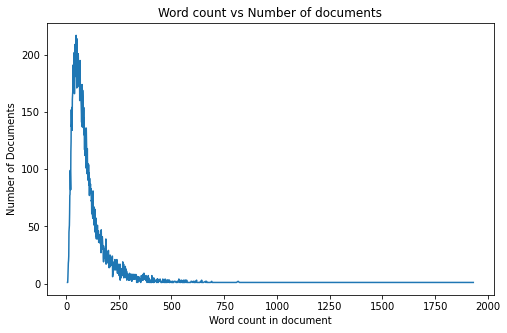

In [ ]:
# Plot the distribution of words vs documents in the corpus
plt.figure(figsize=(8,5))
plt.plot(word_count, doc_count)
plt.xlabel('Word count in document')
plt.ylabel('Number of Documents')
plt.title('Word count vs Number of documents')


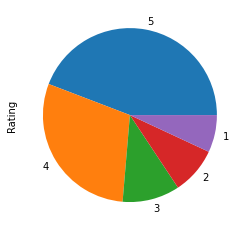

In [ ]:
reviews['Rating'].value_counts().plot.pie()

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f6f1b5a13c8>]],
      dtype=object)

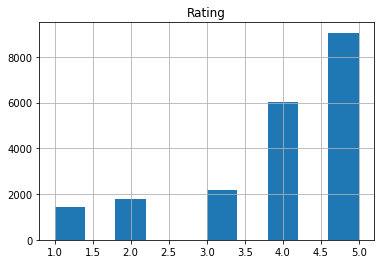

In [ ]:
reviews.hist()

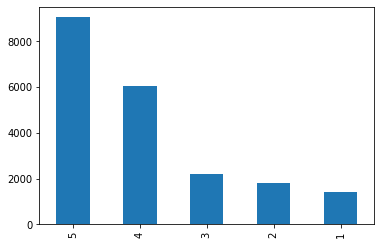

In [ ]:
reviews['Rating'].value_counts().plot.bar()

EDA

TEXT PREPROCESSING / DATA CLEANING


#### This data is already a preprocessed one

In [ ]:
reviews.Review[0:2]

0    nice hotel expensive parking got good deal sta...
1    ok nothing special charge diamond member hilto...
Name: Review, dtype: object

In [ ]:
#Normalize(to lower) 
reviews['Review']=reviews['Review'].apply(lambda x:" ".join(x.lower() for
x in x.split()))
reviews   ######## Reviews are already in lower case

,Review,Rating
0,nice hotel expensive parking got good deal sta...,4
1,ok nothing special charge diamond member hilto...,2
2,nice rooms not 4* experience hotel monaco seat...,3
3,"unique, great stay, wonderful time hotel monac...",5
4,"great stay great stay, went seahawk game aweso...",5
...,...,...
20486,"best kept secret 3rd time staying charm, not 5...",5
20487,great location price view hotel great quick pl...,4
20488,"ok just looks nice modern outside, desk staff ...",2
20489,hotel theft ruined vacation hotel opened sept ...,1


In [ ]:
#Remove punctuations
reviews["Review"] = reviews['Review'].str.replace('[^\w\s]','')
reviews[:6]

,Review,Rating
0,nice hotel expensive parking got good deal sta...,4
1,ok nothing special charge diamond member hilto...,2
2,nice rooms not 4 experience hotel monaco seatt...,3
3,unique great stay wonderful time hotel monaco ...,5
4,great stay great stay went seahawk game awesom...,5
5,love monaco staff husband stayed hotel crazy w...,5


In [ ]:
########Stopword removal
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
stop_words=stopwords.words('english')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
new_words=("hmmmmm","maybe","aveda",'',"th","ect","oh","x","nt","st","bb","rhe","cuz","ca")
for i in new_words:
  stop_words.append(i)

In [ ]:
reviews['Review']=reviews['Review'].apply(lambda x:" ".join(x for x in
x.split()if x not in stop_words))
reviews[0:5]

,Review,Rating
0,nice hotel expensive parking got good deal sta...,4
1,ok nothing special charge diamond member hilto...,2
2,nice rooms 4 experience hotel monaco seattle g...,3
3,unique great stay wonderful time hotel monaco ...,5
4,great stay great stay went seahawk game awesom...,5


In [ ]:
import re  #Regular Expressions

In [ ]:
#Remove numbers 
def text_clean(text):
  text= re.sub(" \d+", " ",text)
  return text
  cleaned=lambda x:text_clean(x)


In [ ]:
reviews['Review'] = reviews['Review'].apply(lambda x: text_clean(x))
reviews[0:5]

,Review,Rating
0,nice hotel expensive parking got good deal sta...,4
1,ok nothing special charge diamond member hilto...,2
2,nice rooms experience hotel monaco seattle go...,3
3,unique great stay wonderful time hotel monaco ...,5
4,great stay great stay went seahawk game awesom...,5


In [ ]:
rev_para=" ".join(reviews['Review'])
rev_para[0:150]

'nice hotel expensive parking got good deal stay hotel anniversary arrived late evening took advice previous reviews valet parking check quick easy lit'

In [ ]:
rev_words=rev_para.split(" ")
rev_words[0:5]

['nice', 'hotel', 'expensive', 'parking', 'got']

In [ ]:
from nltk.util import ngrams
list(ngrams(rev_words,2))

[('nice', 'hotel'),
 ('hotel', 'expensive'),
 ('expensive', 'parking'),
 ('parking', 'got'),
 ('got', 'good'),
 ('good', 'deal'),
 ('deal', 'stay'),
 ('stay', 'hotel'),
 ('hotel', 'anniversary'),
 ('anniversary', 'arrived'),
 ('arrived', 'late'),
 ('late', 'evening'),
 ('evening', 'took'),
 ('took', 'advice'),
 ('advice', 'previous'),
 ('previous', 'reviews'),
 ('reviews', 'valet'),
 ('valet', 'parking'),
 ('parking', 'check'),
 ('check', 'quick'),
 ('quick', 'easy'),
 ('easy', 'little'),
 ('little', 'disappointed'),
 ('disappointed', 'nonexistent'),
 ('nonexistent', 'view'),
 ('view', 'room'),
 ('room', 'room'),
 ('room', 'clean'),
 ('clean', 'nice'),
 ('nice', 'size'),
 ('size', 'bed'),
 ('bed', 'comfortable'),
 ('comfortable', 'woke'),
 ('woke', 'stiff'),
 ('stiff', 'neck'),
 ('neck', 'high'),
 ('high', 'pillows'),
 ('pillows', 'soundproof'),
 ('soundproof', 'like'),
 ('like', 'heard'),
 ('heard', 'music'),
 ('music', 'room'),
 ('room', 'night'),
 ('night', 'morning'),
 ('morning', 

In [ ]:
from nltk.util import ngrams
list(ngrams(rev_words,3))

[('nice', 'hotel', 'expensive'),
 ('hotel', 'expensive', 'parking'),
 ('expensive', 'parking', 'got'),
 ('parking', 'got', 'good'),
 ('got', 'good', 'deal'),
 ('good', 'deal', 'stay'),
 ('deal', 'stay', 'hotel'),
 ('stay', 'hotel', 'anniversary'),
 ('hotel', 'anniversary', 'arrived'),
 ('anniversary', 'arrived', 'late'),
 ('arrived', 'late', 'evening'),
 ('late', 'evening', 'took'),
 ('evening', 'took', 'advice'),
 ('took', 'advice', 'previous'),
 ('advice', 'previous', 'reviews'),
 ('previous', 'reviews', 'valet'),
 ('reviews', 'valet', 'parking'),
 ('valet', 'parking', 'check'),
 ('parking', 'check', 'quick'),
 ('check', 'quick', 'easy'),
 ('quick', 'easy', 'little'),
 ('easy', 'little', 'disappointed'),
 ('little', 'disappointed', 'nonexistent'),
 ('disappointed', 'nonexistent', 'view'),
 ('nonexistent', 'view', 'room'),
 ('view', 'room', 'room'),
 ('room', 'room', 'clean'),
 ('room', 'clean', 'nice'),
 ('clean', 'nice', 'size'),
 ('nice', 'size', 'bed'),
 ('size', 'bed', 'comfortab

In [ ]:
#####Barplot using Counter Function

In [ ]:
corpus=[]
R=reviews['Review'].str.split()
R=R.values.tolist()
corpus=[word for i in R for word in i]


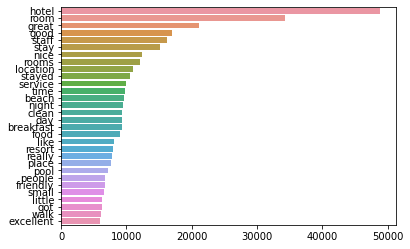

In [ ]:
from collections import Counter
import seaborn as sns
counter=Counter(corpus)
most=counter.most_common()

x, y= [], []
for word,count in most[:30]:
    if (word not in stop_words):
        x.append(word)
        y.append(count)
        
sns.barplot(x=y,y=x)

###### Lemmatization

In [ ]:
from nltk.stem import WordNetLemmatizer 
from nltk.corpus import wordnet
lemmatizer = WordNetLemmatizer() 
nltk.download('wordnet')
import spacy
import nltk
nltk.download('punkt')
text = "".join(reviews['Review'])
tokenization = nltk.word_tokenize(text)
for w in tokenization:
  print("Lemma for {} is {}".format(w,lemmatizer.lemmatize(w)))  

Streaming output truncated to the last 5000 lines.
Lemma for francisco is francisco
Lemma for wanted is wanted
Lemma for try is try
Lemma for different is different
Lemma for time is time
Lemma for gave is gave
Lemma for fivestars is fivestars
Lemma for consideration is consideration
Lemma for paid is paid
Lemma for room is room
Lemma for amenities is amenity
Lemma for received is received
Lemma for paid is paid
Lemma for say is say
Lemma for room is room
Lemma for gave is gave
Lemma for stars is star
Lemma for wanted is wanted
Lemma for share is share
Lemma for tips is tip
Lemma for staying is staying
Lemma for particular is particular
Lemma for california is california
Lemma for residents is resident
Lemma for ic is ic
Lemma for offers is offer
Lemma for package is package
Lemma for inclusive is inclusive
Lemma for valet is valet
Lemma for parking is parking
Lemma for tax is tax
Lemma for night is night
Lemma for buffet is buffet
Lemma for breakfast is breakfast
Lemma for including i

In [ ]:
from nltk import word_tokenize, pos_tag
from collections import defaultdict
from nltk.corpus import wordnet
nltk.download('averaged_perceptron_tagger')
tag_map = defaultdict(lambda : wordnet.NOUN)
tag_map['J'] = wordnet.ADJ
tag_map['V'] = wordnet.VERB
tag_map['R'] = wordnet.ADV
tokens = word_tokenize(text)
lemma_function = WordNetLemmatizer()
for token, tag in pos_tag(tokens):
		lemma = lemma_function.lemmatize(token, tag_map[tag[0]])
		print(token, "=>", lemma)

Streaming output truncated to the last 5000 lines.
amenities => amenity
room => room
forgo => forgo
usual => usual
review => review
synopsis => synopsis
little => little
quirky => quirky
things => thing
checkin => checkin
3 => 3
clock => clock
pm => pm
checkout => checkout
noon => noon
room => room
fully => fully
equipped => equip
automated => automate
minibar => minibar
similar => similar
las => la
vegas => vega
charge => charge
remove => remove
instantly => instantly
snickers => snicker
bar => bar
costs => cost
650 => 650
small => small
coke => coke
costs => cost
400 => 400
order => order
room => room
service => service
automatically => automatically
accessed => access
3 => 3
delivery => delivery
surcharge => surcharge
18 => 18
gratuity => gratuity
local => local
sales => sale
tax => tax
85 => 85
offers => offer
complimentary => complimentary
shoe => shoe
shine => shine
housekeeping => housekeep
turn => turn
room => room
bottled => bottle
water => water
available => available
evian =

#Sentiment Analysis
###Using TextBlob

In [ ]:
from textblob import TextBlob
pol=lambda x: TextBlob(x).sentiment.polarity
sub=lambda x: TextBlob(x).sentiment.subjectivity

############################################ Polarity is float which lies in the range of [-1,1] where 1 means positive statement and -1 means a negative statement. subjectivity is a matric between 0 and 1(1 is highly subjective)

In [ ]:
reviews['polarity']=reviews['Review'].apply(pol)
reviews['subjectivity']=reviews['Review'].apply(sub)


In [ ]:
reviews[0:10]

,Review,Rating,polarity,subjectivity
0,nice hotel expensive parking got good deal sta...,4,0.208744,0.687000
1,ok nothing special charge diamond member hilto...,2,0.248633,0.523295
2,nice rooms experience hotel monaco seattle go...,3,0.294420,0.605208
3,unique great stay wonderful time hotel monaco ...,5,0.504825,0.691228
4,great stay great stay went seahawk game awesom...,5,0.471154,0.629396
5,love monaco staff husband stayed hotel crazy w...,5,0.243056,0.614583
6,cozy stay rainy city husband spent nights mon...,5,0.366661,0.631890
7,excellent staff housekeeping quality hotel cho...,4,0.562963,0.788889
8,hotel stayed hotel monaco cruise rooms generou...,5,0.312946,0.576786
9,excellent stayed hotel monaco past delight rec...,5,0.286355,0.534066


In [ ]:
import numpy as np
conditionList = [
    reviews['polarity'] == 0,
    reviews['polarity'] > 0,
    reviews['polarity'] < 0]
choiceList = ['neutral', 'positive', 'negative']
reviews['label'] = np.select(conditionList, choiceList, default='no_label')
print(reviews)

                                                  Review  ...     label
0      nice hotel expensive parking got good deal sta...  ...  positive
1      ok nothing special charge diamond member hilto...  ...  positive
2      nice rooms  experience hotel monaco seattle go...  ...  positive
3      unique great stay wonderful time hotel monaco ...  ...  positive
4      great stay great stay went seahawk game awesom...  ...  positive
...                                                  ...  ...       ...
20486  best kept secret rd time staying charm star ca...  ...  positive
20487  great location price view hotel great quick pl...  ...  positive
20488  ok looks nice modern outside desk staff nt par...  ...  positive
20489  hotel theft ruined vacation hotel opened sept ...  ...  positive
20490  people talking ca nt believe excellent ratings...  ...  positive

[20491 rows x 5 columns]


In [ ]:
label_count=reviews['label'].value_counts()
print(label_count)

positive    19319
negative     1148
neutral        24
Name: label, dtype: int64


<function matplotlib.pyplot.show>

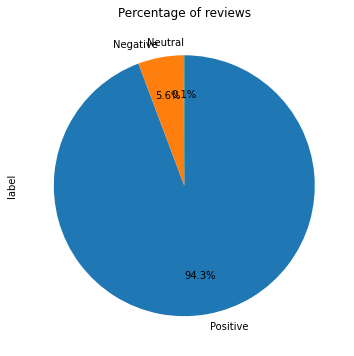

In [ ]:
import matplotlib.pyplot as plt
labels = ['Positive','Negative','Neutral']
label_count.plot(kind='pie',labels=labels,counterclock=False,startangle=90,autopct='%1.1f%%',pctdistance=0.7,figsize=(12,6))
plt.title("Percentage of reviews")
plt.show

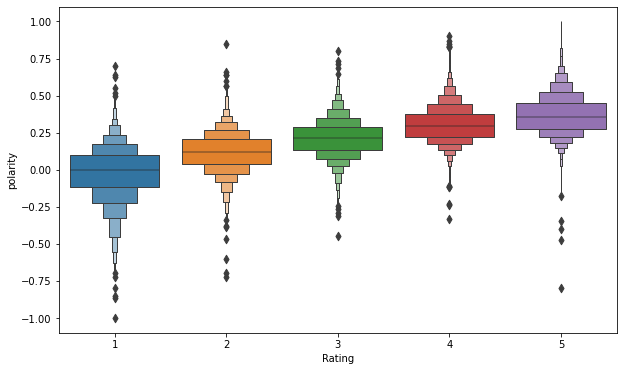

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
sns.boxenplot(x='Rating', y='polarity', data=reviews)
plt.show();

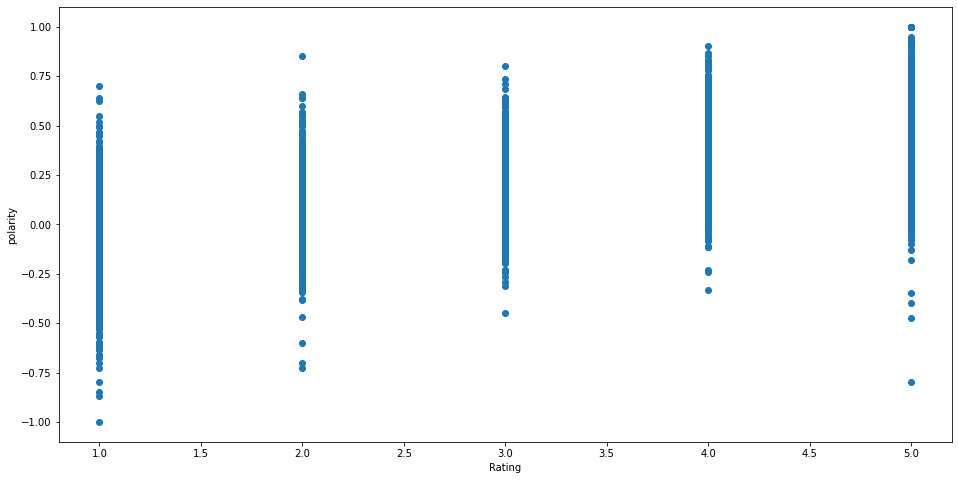

In [ ]:
fig, ax = plt.subplots(figsize=(16,8))
ax.scatter(reviews['Rating'],reviews['polarity'])
ax.set_xlabel('Rating')
ax.set_ylabel('polarity')
plt.show()

NAMED ENTITY RECOGNITION


In [ ]:
!python -m spacy download en_core_web_sm

In [ ]:
import spacy

nlp = spacy.load("en_core_web_sm")

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


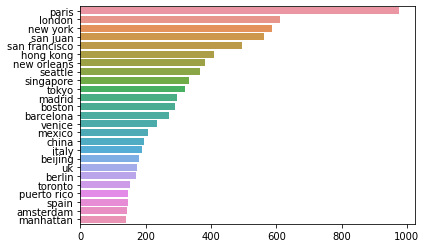

In [ ]:
def ner(text,ent="GPE"):
    doc=nlp(text)
    return [X.text for X in doc.ents if X.label_ == ent]

gpe= reviews['Review'].apply(lambda x: ner(x))
gpe=[i for x in gpe for i in x]
counter=Counter(gpe)

x,y=map(list,zip(*counter.most_common(25)))
sns.barplot(y,x)

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


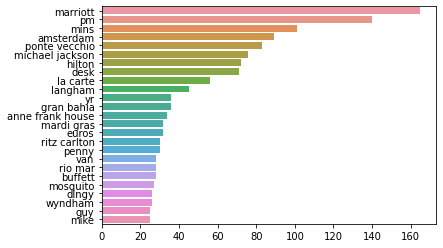

In [ ]:
def ner(text,ent="PERSON"):
    doc=nlp(text)
    return [X.text for X in doc.ents if X.label_ == ent]

person= reviews['Review'].apply(lambda x: ner(x))
person=[i for x in person for i in x]
counter=Counter(person)

x,y=map(list,zip(*counter.most_common(25)))
sns.barplot(y,x)

## Review classificaion based on Polarity

---



In [ ]:
pos_rev=reviews[reviews['polarity']>0]      ###positive reviews based on polarity score
pos_rev[0:5]

,Review,Rating,polarity,subjectivity,label
0,nice hotel expensive parking got good deal sta...,4,0.208744,0.687000,positive
1,ok nothing special charge diamond member hilto...,2,0.248633,0.523295,positive
2,nice rooms experience hotel monaco seattle go...,3,0.294420,0.605208,positive
3,unique great stay wonderful time hotel monaco ...,5,0.504825,0.691228,positive
4,great stay great stay went seahawk game awesom...,5,0.471154,0.629396,positive


In [ ]:
len(pos_rev)

19319

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fd7a3b823c8>,
      dtype=object)

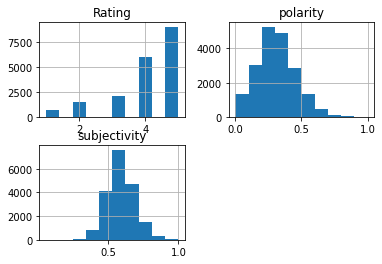

In [ ]:
pos_rev.hist()

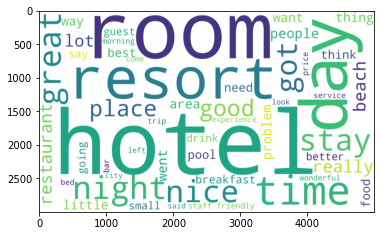

In [ ]:
Pos_pol="".join(pos_rev['Review'])
###Positive Wordcloud
#import matplotlib.pyplot
import matplotlib.pyplot as plt
from matplotlib.pyplot import imread
%matplotlib inline
#import stopwords
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
Word_cloud=WordCloud(width=5000,height=3000,max_words=50,background_color="white").generate(Pos_pol)
plt.imshow(Word_cloud,interpolation="bilinear")

In [ ]:
Pos_pol_word2=Pos_pol.split(" ")
Pos_pol_word2[0:5]
from nltk.util import ngrams
Bi=list(ngrams(Pos_pol_word2,2))
Bi[0:5]

[('nice', 'hotel'),
 ('hotel', 'expensive'),
 ('expensive', 'parking'),
 ('parking', 'got'),
 ('got', 'good')]

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

In [ ]:
stop=stopwords.words('english')
stop.append("hotel")
stop.append("punta")
stop.append("cana")

In [ ]:

def plot_top_ngrams_barchart(pos_rev, n=2):
    stop=set(stopwords.words('english'))
   
    new= pos_rev.str.split()
    new=new.values.tolist()
    corpus1=[word for i in new for word in i]

    def _get_top_ngram(corpus1, n=None):
        vec = CountVectorizer(ngram_range=(n, n)).fit(corpus1)
        bag_of_words = vec.transform(corpus1)
        sum_words = bag_of_words.sum(axis=0) 
        words_freq = [(word, sum_words[0, idx]) 
                      for word, idx in vec.vocabulary_.items()]
        words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
        return words_freq[:10]

    top_n_bigrams=_get_top_ngram(pos_rev,n)[:10]
    x,y=map(list,zip(*top_n_bigrams))
    sns.barplot(x=y,y=x)

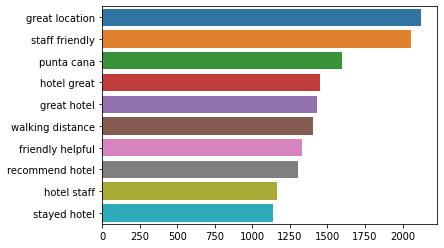

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
plot_top_ngrams_barchart(pos_rev['Review'],2)

In [ ]:
import collections
BigramFreq = collections.Counter(Bi)
BigramFreq.most_common(15)

[(('staff', 'friendly'), 2042),
 (('punta', 'cana'), 1550),
 (('great', 'location'), 1493),
 (('hotel', 'great'), 1427),
 (('walking', 'distance'), 1387),
 (('friendly', 'helpful'), 1307),
 (('hotel', 'staff'), 1156),
 (('stayed', 'hotel'), 1122),
 (('room', 'service'), 1099),
 (('recommend', 'hotel'), 1052),
 (('staff', 'helpful'), 1005),
 (('minute', 'walk'), 997),
 (('room', 'clean'), 991),
 (('highly', 'recommend'), 915),
 (('place', 'stay'), 897)]

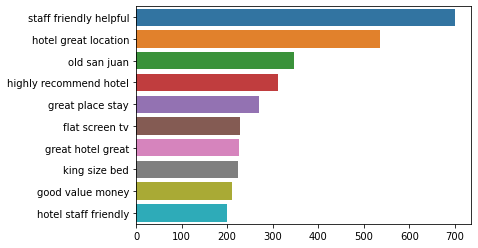

In [ ]:
plot_top_ngrams_barchart(pos_rev['Review'],3)

In [ ]:
Pos_pol_word3=Pos_pol.split(" ")
Pos_pol_word3[0:5]
from nltk.util import ngrams
Tri=list(ngrams(Pos_pol_word3,3))
Tri[0:6]

[('nice', 'hotel', 'expensive'),
 ('hotel', 'expensive', 'parking'),
 ('expensive', 'parking', 'got'),
 ('parking', 'got', 'good'),
 ('got', 'good', 'deal'),
 ('good', 'deal', 'stay')]

In [ ]:
import collections
TrigramFreq = collections.Counter(Tri)
TrigramFreq.most_common(15)

[(('staff', 'friendly', 'helpful'), 687),
 (('hotel', 'great', 'location'), 528),
 (('old', 'san', 'juan'), 341),
 (('highly', 'recommend', 'hotel'), 245),
 (('flat', 'screen', 'tv'), 227),
 (('king', 'size', 'bed'), 223),
 (('hotel', 'staff', 'friendly'), 199),
 (('10', 'minute', 'walk'), 198),
 (('stayed', '3', 'nights'), 189),
 (('easy', 'walking', 'distance'), 186),
 (('5', 'minute', 'walk'), 184),
 (('free', 'internet', 'access'), 183),
 (('hotel', 'good', 'location'), 172),
 (('la', 'carte', 'restaurants'), 165),
 (('staff', 'helpful', 'friendly'), 156)]

In [ ]:
neg_rev=reviews[reviews['polarity']<0]      ###negative reviews based on polarity score
neg_rev[0:5]

,Review,Rating,polarity,subjectivity,label
42,warwick bad good reviews warwick shocks staff ...,2,-0.080000,0.633333,negative
44,austin powers decor familiar hotel seattlewher...,2,-0.043056,0.533333,negative
65,hated inn terrible roomservice horrible staff ...,1,-0.633333,0.725000,negative
76,stay clear internet reservation friday rang ho...,1,-0.142857,0.547619,negative
77,single rooms like hospital rooms single rooms ...,1,-0.164947,0.330026,negative


In [ ]:
len(neg_rev)

1148

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f34a276a5f8>,
      dtype=object)

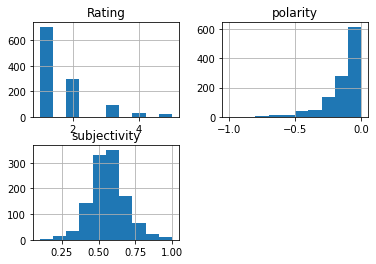

In [ ]:
neg_rev.hist()

In [ ]:
Neg_pol="".join(neg_rev['Review'])

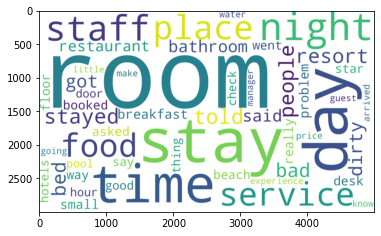

In [ ]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
Word_cloud=WordCloud(width=5000,height=3000,max_words=50,background_color="white").generate(Neg_pol)
plt.imshow(Word_cloud,interpolation="bilinear")

In [ ]:
Neg_pol_words=Neg_pol.split(" ")
Neg_pol_words[0:5]
from nltk.util import ngrams
Neg_bi=list(ngrams(Neg_pol_words,2))
Neg_bi[0:10]

[('warwick', 'bad'),
 ('bad', 'good'),
 ('good', 'reviews'),
 ('reviews', 'warwick'),
 ('warwick', 'shocks'),
 ('shocks', 'staff'),
 ('staff', 'quite'),
 ('quite', 'rude'),
 ('rude', 'rooms'),
 ('rooms', 'fairly')]

In [ ]:
def plot_top_ngrams_barchart(neg_rev, n=2):
    stop=set(stopwords.words('english'))

    new= neg_rev.str.split()
    new=new.values.tolist()
    corpus1=[word for i in new for word in i]

    def _get_top_ngram(corpus1, n=None):
        vec = CountVectorizer(ngram_range=(n, n)).fit(corpus1)
        bag_of_words = vec.transform(corpus1)
        sum_words = bag_of_words.sum(axis=0) 
        words_freq = [(word, sum_words[0, idx]) 
                      for word, idx in vec.vocabulary_.items()]
        words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
        return words_freq[:10]

    top_n_bigrams=_get_top_ngram(neg_rev,n)[:10]
    x,y=map(list,zip(*top_n_bigrams))
    sns.barplot(x=y,y=x)

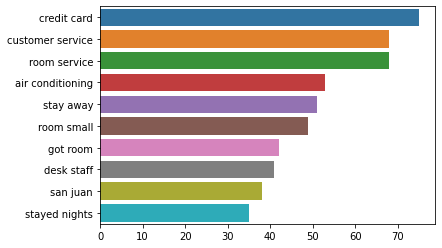

In [ ]:
plot_top_ngrams_barchart(neg_rev['Review'],2)

In [ ]:
import collections
Neg_biFreq = collections.Counter(Neg_bi)
Neg_biFreq.most_common(15)

[(('punta', 'cana'), 83),
 (('credit', 'card'), 75),
 (('star', 'hotel'), 68),
 (('room', 'service'), 68),
 (('customer', 'service'), 67),
 (('stay', 'hotel'), 62),
 (('hotel', 'room'), 62),
 (('stayed', 'hotel'), 56),
 (('air', 'conditioning'), 52),
 (('5', 'star'), 52),
 (('room', 'small'), 46),
 (('hotel', 'stayed'), 46),
 (('worst', 'hotel'), 46),
 (('hotel', 'staff'), 43),
 (('desk', 'staff'), 41)]

In [ ]:
Neg_pol_words=Neg_pol.split(" ")
Neg_pol_words[0:5]
from nltk.util import ngrams
Neg_tri=list(ngrams(Neg_pol_words,3))
Neg_tri[0:5]

[('warwick', 'bad', 'good'),
 ('bad', 'good', 'reviews'),
 ('good', 'reviews', 'warwick'),
 ('reviews', 'warwick', 'shocks'),
 ('warwick', 'shocks', 'staff')]

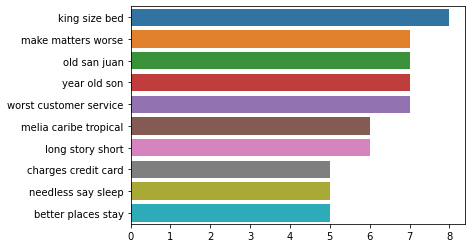

In [ ]:
plot_top_ngrams_barchart(neg_rev['Review'],3)

In [ ]:
import collections
Neg_triFreq = collections.Counter(Neg_tri)
Neg_triFreq.most_common(40)

[(('worst', 'hotel', 'stayed'), 21),
 (('4', 'star', 'hotel'), 19),
 (('5', 'star', 'hotel'), 13),
 (('3', 'star', 'hotel'), 10),
 (('king', 'size', 'bed'), 8),
 (('stayed', '3', 'nights'), 8),
 (('worst', 'hotel', 'experience'), 7),
 (('make', 'matters', 'worse'), 7),
 (('old', 'san', 'juan'), 7),
 (('year', 'old', 'son'), 7),
 (('resort', 'punta', 'cana'), 7),
 (('stayed', '2', 'nights'), 7),
 (('2', 'single', 'beds'), 7),
 (('melia', 'caribe', 'tropical'), 6),
 (('long', 'story', 'short'), 6),
 (('4', '5', 'star'), 6),
 (('far', 'worst', 'hotel'), 6),
 (('husband', 'stayed', 'hotel'), 5),
 (('charges', 'credit', 'card'), 5),
 (('needless', 'say', 'sleep'), 5),
 (('better', 'places', 'stay'), 5),
 (('disturb', 'sign', 'door'), 5),
 (('5', 'star', 'resort'), 5),
 (('desk', 'staff', 'rude'), 5),
 (('called', 'desk', 'told'), 5),
 (('water', 'pressure', 'shower'), 5),
 (('hotel', 'great', 'location'), 5),
 (('la', 'carte', 'restaurants'), 5),
 (('spoke', 'little', 'english'), 5),
 (('cr

classification based on Rating


In [ ]:
Reviews=reviews.drop(['label','subjectivity','polarity'],axis=1)
Reviews[0:2]


,Review,Rating
0,nice hotel expensive parking got good deal sta...,4
1,ok nothing special charge diamond member hilto...,2


In [ ]:
neutral=Reviews[reviews['Rating']==3]      ###Neutral reviews 
neutral[0:5]

,Review,Rating
2,nice rooms experience hotel monaco seattle go...,3
13,nice hotel nice staff hotel lovely staff quite...,3
19,hmmmmm say really high hopes hotel monaco chos...,3
25,nt mind noise place great read reviews noise u...,3
27,met expectations centrally located hotel block...,3


In [ ]:
len(neutral)    #2184 reviews with rating=3   considered as neutral reviews

2184

In [ ]:
positive=Reviews[reviews['Rating']>3]      ###positive reviews based on rating
positive[0:5]

,Review,Rating
0,nice hotel expensive parking got good deal sta...,4
3,unique great stay wonderful time hotel monaco ...,5
4,great stay great stay went seahawk game awesom...,5
5,love monaco staff husband stayed hotel crazy w...,5
6,cozy stay rainy city husband spent nights mon...,5


In [ ]:
len(positive)

15093

In [ ]:
Positive="".join(positive['Review'])

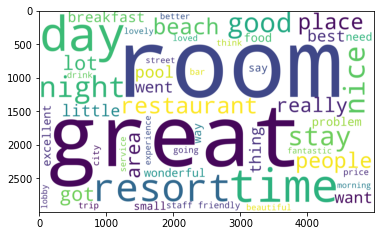

In [ ]:
Word_cloud=WordCloud(width=5000,height=3000,max_words=50,background_color="white").generate(Positive)
plt.imshow(Word_cloud,interpolation="bilinear")

In [ ]:
negative=Reviews[reviews['Rating']<3]      ###Negative reviews based on rating
negative[0:5]

,Review,Rating
1,ok nothing special charge diamond member hilto...,2
10,poor value stayed monaco seattle july nice hot...,2
15,horrible customer service hotel stay february ...,1
16,disappointed say anticipating stay hotel monac...,2
24,great location need internally upgrade advanta...,2


In [ ]:
len(negative)

3214

In [ ]:
Negative="".join(negative['Review'])

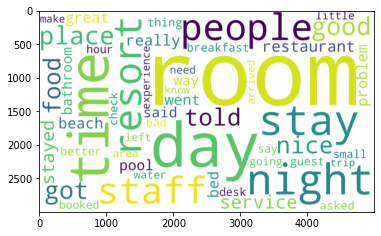

In [ ]:
#negative wordcloud
Word_cloud=WordCloud(width=5000,height=3000, max_words=50,background_color="white").generate(Negative)
plt.imshow(Word_cloud,interpolation="bilinear")

In [ ]:
import numpy as np
conditionList = [
    Reviews['Rating'] == 3,
    Reviews['Rating'] > 3,
    Reviews['Rating'] < 3]
choiceList = ['neutral', 'positive', 'negative']
Reviews['label'] = np.select(conditionList, choiceList, default='no_label')
print(Reviews)

                                                  Review  Rating     label
0      nice hotel expensive parking got good deal sta...       4  positive
1      ok nothing special charge diamond member hilto...       2  negative
2      nice rooms  experience hotel monaco seattle go...       3   neutral
3      unique great stay wonderful time hotel monaco ...       5  positive
4      great stay great stay went seahawk game awesom...       5  positive
...                                                  ...     ...       ...
20486  best kept secret rd time staying charm star ca...       5  positive
20487  great location price view hotel great quick pl...       4  positive
20488  ok looks nice modern outside desk staff nt par...       2  negative
20489  hotel theft ruined vacation hotel opened sept ...       1  negative
20490  people talking ca nt believe excellent ratings...       2  negative

[20491 rows x 3 columns]


Saving Reviews as csv file

In [ ]:
Reviews.to_csv('Reviews.csv')

In [ ]:
ls

hotel_reviews.csv  sample_data/


In [ ]:
#Reviews=pd.read_csv("Reviews.csv")

In [ ]:
rev_split = Reviews['Review'].str.split(' ')   #split each review to words
rev_split.head()

0    [nice, hotel, expensive, parking, got, good, d...
1    [ok, nothing, special, charge, diamond, member...
2    [nice, rooms, , experience, hotel, monaco, sea...
3    [unique, great, stay, wonderful, time, hotel, ...
4    [great, stay, great, stay, went, seahawk, game...
Name: Review, dtype: object

In [ ]:
data = rev_split.tolist()    #list of list
y = Reviews['label'].tolist()

In [ ]:
data[0]

['nice',
 'hotel',
 'expensive',
 'parking',
 'got',
 'good',
 'deal',
 'stay',
 'hotel',
 'anniversary',
 'arrived',
 'late',
 'evening',
 'took',
 'advice',
 'previous',
 'reviews',
 'valet',
 'parking',
 'check',
 'quick',
 'easy',
 'little',
 'disappointed',
 'nonexistent',
 'view',
 'room',
 'room',
 'clean',
 'nice',
 'size',
 'bed',
 'comfortable',
 'woke',
 'stiff',
 'neck',
 'high',
 'pillows',
 'soundproof',
 'like',
 'heard',
 'music',
 'room',
 'night',
 'morning',
 'loud',
 'bangs',
 'doors',
 'opening',
 'closing',
 'hear',
 'people',
 'talking',
 'hallway',
 'noisy',
 'neighbors',
 'bath',
 'products',
 'nice',
 'goldfish',
 'stay',
 'nice',
 'touch',
 'taken',
 'advantage',
 'staying',
 'longer',
 'location',
 'great',
 'walking',
 'distance',
 'shopping',
 'overall',
 'nice',
 'experience',
 'pay',
 '',
 'parking',
 'night']

In [ ]:
y[0:5]

['positive', 'negative', 'neutral', 'positive', 'positive']

In [ ]:
#join all the reviews in a single paragraph
rev=" ".join(Reviews['Review'])
rev

'nice hotel expensive parking got good deal stay hotel anniversary arrived late evening took advice previous reviews valet parking check quick easy little disappointed nonexistent view room room clean nice size bed comfortable woke stiff neck high pillows soundproof like heard music room night morning loud bangs doors opening closing hear people talking hallway noisy neighbors bath products nice goldfish stay nice touch taken advantage staying longer location great walking distance shopping overall nice experience pay  parking night ok nothing special charge diamond member hilton decided chain shot th anniversary seattle start booked suite paid extra website description suite bedroom bathroom standard hotel room took printed reservation desk showed said things like tv couch desk clerk told mixed suites description kimpton website sorry free breakfast got kidding embassy suits sitting room bathroom bedroom unlike kimpton calls suite  day stay offer correct false advertising send kimpton

In [ ]:
len(rev)     #14833369 initial wordlength

13996182

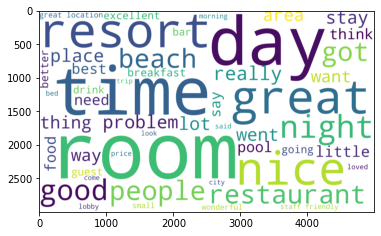

In [ ]:
Word_cloud=WordCloud(width=5000,height=3000, max_words=50,background_color="white").generate(rev)
plt.imshow(Word_cloud,interpolation="bilinear")

**TOPIC MODELING**

In [ ]:
import gensim
from gensim import corpora

In [ ]:
! conda install -c memex pyldavis

/bin/bash: conda: command not found


In [ ]:
dictionary = corpora.Dictionary(data)

In [ ]:
doc_term_matrix = [dictionary.doc2bow(rev) for rev in data]

In [ ]:
# Creating the object for LDA model using gensim library
LDA = gensim.models.ldamodel.LdaModel

# Build LDA model
lda_model = LDA(corpus=doc_term_matrix, id2word=dictionary, num_topics=5, random_state=100,
                chunksize=1000, passes=50)

In [ ]:
lda_model.print_topics()

[(0,
  '0.026*"" + 0.022*"room" + 0.013*"hotel" + 0.008*"day" + 0.007*"told" + 0.007*"got" + 0.006*"staff" + 0.006*"service" + 0.006*"time" + 0.005*"said"'),
 (1,
  '0.051*"hotel" + 0.025*"" + 0.017*"great" + 0.016*"room" + 0.015*"location" + 0.014*"good" + 0.012*"staff" + 0.011*"breakfast" + 0.010*"clean" + 0.009*"stay"'),
 (2,
  '0.030*"" + 0.018*"beach" + 0.015*"resort" + 0.013*"food" + 0.012*"good" + 0.012*"pool" + 0.011*"great" + 0.007*"time" + 0.007*"people" + 0.007*"nice"'),
 (3,
  '0.027*"hotel" + 0.018*"staff" + 0.016*"great" + 0.015*"stay" + 0.013*"service" + 0.009*"stayed" + 0.009*"wonderful" + 0.008*"best" + 0.006*"loved" + 0.006*"excellent"'),
 (4,
  '0.030*"room" + 0.027*"hotel" + 0.024*"" + 0.010*"nice" + 0.008*"stay" + 0.008*"good" + 0.008*"rooms" + 0.007*"night" + 0.006*"floor" + 0.006*"great"')]

In [ ]:
!pip install pyLDAvis

In [ ]:
# Visualize the topics
import pyLDAvis
import pyLDAvis.gensim

In [ ]:
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(lda_model, doc_term_matrix, dictionary)
pyLDAvis.display(vis)

Each bubble on the left-hand side plot represents a topic. The larger the bubble, the more prevalent is that topic.

A good topic model will have fairly big, non-overlapping bubbles scattered throughout the chart instead of being clustered in one quadrant.

A model with too many topics, will typically have many overlaps, small sized bubbles clustered in one region of the chart.

Alright, if you move the cursor over one of the bubbles, the words and bars on the right-hand side will update. These words are the salient keywords that form the selected topic.

**FEATURE EXTRACTION**

#############create vocabulary of all unique words from corpus. create a matrix of features by assigning a separate column for each word, while each row corresponds to a review. This process is known as Text Vectorization
##############we get vectors corresponding to words

In [ ]:
#####BoW (Bag Of Words Model)
###In BoW there are only two values 0 and 1(if a word is present in the sentence get score 1 else get the score 0). BoW has high dimensionality(which provides so many meaningful words.
### We cant identify which word is most important.BoW does not consider the Semantic Relationship between words

#import sklearn
#from sklearn.feature_extraction.text import CountVectorizer
#vectorizer=CountVectorizer()
#x=vectorizer.fit_transform(lem)

In [ ]:
#stop_words.append("hotel")
#Lem=[word for word in lem if not word in stop_words]
##print(vectorizer.vocabulary_)

In [ ]:
#word_freq=sorted(vectorizer.vocabulary_,key=lambda x:x[1])
#wf_df=pd.DataFrame(word_freq)
#wf_df.columns=['word']
#wf_df[0:30]

In [ ]:
#print(vectorizer.get_feature_names()[50:100])
#print(X.toarray()[50:100])

####error:Your session crashed after using all available RAM.  Cant use BoW because of vector length issue

TF-IDF FEATURE EXTRACTION


In [ ]:
#####TFIDF
####TERM FREQUENCY= no:repeatation of a word in a sentence/total number words in that sentence
#####INVERSE DOCUMENT FREQUENCY: log(no:ofsentences or corpus/no:of sentences containing the word)
#####TF*IDF
#####In TF-IDF we get different different values rather than 1's and 0's. From that values we can identify which word is more important(higher the value greater the importance)
###Limitation of TF-IDF= TF-IDF gives importance to uncommon words.This may lead to overfitting problems.TF-IDF also does not consider the Semantic Relationship between words


In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from nltk import word_tokenize
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [ ]:
Rev_list=Reviews['Review'].tolist()
Rev_list[0]

'nice hotel expensive parking got good deal stay hotel anniversary arrived late evening took advice previous reviews valet parking check quick easy little disappointed nonexistent view room room clean nice size bed comfortable woke stiff neck high pillows soundproof like heard music room night morning loud bangs doors opening closing hear people talking hallway maybe noisy neighbors aveda bath products nice goldfish stay nice touch taken advantage staying longer location great walking distance shopping overall nice experience pay  parking night'

In [ ]:
### Creating a python object of the class CountVectorizer using bigram
tfidf_counts = TfidfVectorizer(tokenizer= word_tokenize, # type of tokenization
                               stop_words=stop_words, # List of stopwords
                               ngram_range=(2,2)) # number of n-grams

tfidf_data = tfidf_counts.fit_transform(Rev_list)

In [ ]:
pickle.dump(tfidf_counts,open('tf.pkl','wb'))

In [ ]:
print(tfidf_data[0])

NameError: ignored

In [ ]:
from sklearn.model_selection import train_test_split
# Splitting the data into train data and test data
X_train, X_test, y_train, y_test = train_test_split(tfidf_data,y, test_size = 0.20, random_state = 1)

In [ ]:
X_train.shape

(16392, 976228)

In [ ]:
X_test.shape

(4099, 1009288)

In [ ]:
np.shape(y_train)

(16392,)

In [ ]:
np.shape(y_test)

(4099,)

**Train the model-Random Forest Classifier**

In [ ]:
from sklearn.ensemble import RandomForestClassifier
clf=RandomForestClassifier(n_estimators=100,criterion='entropy')

In [ ]:
##Train the model
clf.fit(X_train,y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='entropy', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [ ]:
###predict the training data
Y_pred_train=clf.predict(X_train)
print(Y_pred_train)

['negative' 'positive' 'neutral' ... 'positive' 'positive' 'positive']


In [ ]:
# Computation of the evaluation scores
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix
print('Accuracy = ','%.2f'%(accuracy_score(y_train,Y_pred_train)*100))                 

Accuracy =  100.00


In [ ]:
y_pred= clf.predict(X_test)
print(y_pred)

['positive' 'positive' 'positive' ... 'positive' 'positive' 'positive']


In [ ]:
# Computation of the evaluation scores
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix
print('Accuracy = ','%.2f'%(accuracy_score(y_test, y_pred)*100))        ##overfitting          

Accuracy =  77.26


In [ ]:
#Classification Report
from sklearn.metrics import classification_report
report=classification_report(y_test, y_pred)
print(report)

              precision    recall  f1-score   support

    negative       0.93      0.19      0.32       649
     neutral       1.00      0.01      0.01       408
    positive       0.77      1.00      0.87      3042

    accuracy                           0.77      4099
   macro avg       0.90      0.40      0.40      4099
weighted avg       0.82      0.77      0.70      4099



In [ ]:
import pickle

In [ ]:
with open('clf_pickle','wb') as f:
  pickle.dump(clf,f)

In [ ]:
with open('clf_pickle','rb') as f:
  clf=pickle.load(f)

**Model Building- Support Vector Machine**

In [ ]:
#Import svm model
from sklearn import svm

In [ ]:
#Create a svm Classifier
SVM = svm.SVC(kernel='linear') # Linear Kernel


In [ ]:
#Train the model using the training sets
SVM.fit(X_train,y_train)

SVC(C=1.0, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='scale', kernel='linear',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)

In [ ]:
##predict the training data
y_predsvm_train=SVM.predict(X_train)

In [ ]:
print('Accuracy = ','%.2f'%(accuracy_score(y_train,y_predsvm_train)*100))   

Accuracy =  99.71


In [ ]:
#predict the test data
y_pred = SVM.predict(X_test)

In [ ]:
#Classification Report
from sklearn.metrics import classification_report
report_svm=classification_report(y_test, y_pred)
print(report_svm)

              precision    recall  f1-score   support

    negative       0.88      0.34      0.49       649
     neutral       1.00      0.02      0.03       408
    positive       0.79      1.00      0.88      3042

    accuracy                           0.80      4099
   macro avg       0.89      0.45      0.47      4099
weighted avg       0.83      0.80      0.74      4099



In [ ]:
with open('SVM_pickle','wb') as f:
  pickle.dump(SVM,f)

In [ ]:
with open('SVM_pickle','rb') as f:
  SVM=pickle.load(f)

**Logistic Regression**

In [ ]:
#train the model
from sklearn.linear_model import LogisticRegression
Lr_tfidf = LogisticRegression()
Lr_tfidf.fit(X_train,y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [ ]:
#predict the training model
y_Pred_train = Lr_tfidf.predict(X_train)
print(y_Pred_train)

['negative' 'positive' 'positive' ... 'positive' 'positive' 'positive']


In [ ]:
# Computation of the evaluation scores
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix
print('Accuracy = ','%.2f'%(accuracy_score(y_train,y_Pred_train)*100))                 #Low accuracy.Data is biased..Accuracy ismore than Randoforest classifier

Accuracy =  84.02


In [ ]:
y_Pred_test=Lr_tfidf.predict(X_test)
print(y_Pred_test)


['positive' 'positive' 'positive' ... 'positive' 'positive' 'positive']


In [ ]:
#Classification Report
from sklearn.metrics import classification_report
Report=classification_report(y_test,y_Pred_test)
print(Report)                                                    #train accuracy higher so model is over fitted

              precision    recall  f1-score   support

    negative       0.97      0.06      0.11       649
     neutral       0.00      0.00      0.00       408
    positive       0.75      1.00      0.86      3042

    accuracy                           0.75      4099
   macro avg       0.57      0.35      0.32      4099
weighted avg       0.71      0.75      0.65      4099



/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
with open('Lr_tfidf_pickle','wb') as f:
  pickle.dump(Lr_tfidf,f)

In [ ]:
with open('Lr_tfidf_pickle','rb') as f:
  Lr_tfidf=pickle.load(f)

**BOOSTING**  -eXtreme Gradient Boosting

In [ ]:
from xgboost import XGBClassifier

In [ ]:
xgb_model=XGBClassifier()

In [ ]:
#train the model
xgb_model.fit(X_train,y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='multi:softprob', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

In [ ]:
#predict the training model
y_Predxgb_train = xgb_model.predict(X_train)
print(y_Predxgb_train)

['positive' 'positive' 'positive' ... 'positive' 'positive' 'positive']


In [ ]:
#Train accuracy
print('Accuracy = ','%.2f'%(accuracy_score(y_train,y_Predxgb_train)*100))     

Accuracy =  75.26


In [ ]:
#predict the test model
y_Predxgb = xgb_model.predict(X_test)
print(y_Predxgb)

['positive' 'positive' 'positive' ... 'positive' 'positive' 'positive']


In [ ]:
#Classification Report
from sklearn.metrics import classification_report
Report=classification_report(y_test,y_Predxgb)
print(Report)                                         # equal accuracy

              precision    recall  f1-score   support

    negative       0.89      0.09      0.17       649
     neutral       0.67      0.02      0.04       408
    positive       0.76      1.00      0.86      3042

    accuracy                           0.76      4099
   macro avg       0.77      0.37      0.35      4099
weighted avg       0.77      0.76      0.67      4099



In [ ]:
with open('xgb_model_pickle','wb') as f:
  pickle.dump(xgb_model,f)

In [ ]:
with open('xgb_model_pickle','rb') as f:
  xgb_model=pickle.load(f)

**Model Building -KNN**

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
knn_model= KNeighborsClassifier(n_neighbors=5)
knn_model.fit(X_train, y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                     weights='uniform')

In [ ]:
#predict the training model
y_Predknn_train =knn_model.predict(X_train)
print(y_Predknn_train)

['negative' 'positive' 'neutral' ... 'positive' 'positive' 'positive']


In [ ]:
#Train accuracy
print('Accuracy = ','%.2f'%(accuracy_score(y_train,y_Predknn_train)*100))    

Accuracy =  81.59


In [ ]:
#predict the test model
y_predknn=knn_model.predict(X_test)

In [ ]:
print(y_predknn)

['positive' 'positive' 'positive' ... 'positive' 'positive' 'neutral']


In [ ]:
#Classification Report
from sklearn.metrics import classification_report
Report=classification_report(y_test,y_predknn)
print(Report)                                           #overfitted

              precision    recall  f1-score   support

    negative       0.71      0.31      0.44       649
     neutral       0.26      0.06      0.10       408
    positive       0.79      0.97      0.87      3042

    accuracy                           0.78      4099
   macro avg       0.59      0.45      0.47      4099
weighted avg       0.73      0.78      0.73      4099



In [ ]:
with open('knn_model_pickle','wb') as f:
  pickle.dump(knn_model,f)

In [ ]:
with open('knn_model_pickle','rb') as f:
  knn_model=pickle.load(f)

**DECISION TREE**

In [ ]:
 from sklearn import tree
 DT_model= tree.DecisionTreeClassifier()
 DT_model.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [ ]:
y_predDT_train=DT_model.predict(X_train)

In [ ]:
#Train accuracy
print('Accuracy = ','%.2f'%(accuracy_score(y_train,y_predDT_train)*100))  

Accuracy =  100.00


In [ ]:
y_predDT=DT_model.predict(X_test)

In [ ]:
print(y_predDT)

['positive' 'positive' 'positive' ... 'positive' 'positive' 'neutral']


In [ ]:
#Classification Report
from sklearn.metrics import classification_report
Report=classification_report(y_test,y_predDT)
print(Report)                                             #over fitted

              precision    recall  f1-score   support

    negative       0.48      0.46      0.47       649
     neutral       0.25      0.17      0.20       408
    positive       0.83      0.88      0.85      3042

    accuracy                           0.74      4099
   macro avg       0.52      0.50      0.51      4099
weighted avg       0.72      0.74      0.73      4099



In [ ]:
with open('DT_model_pickle','wb') as f:
  pickle.dump(DT_model,f)

In [ ]:
with open('DT_model_pickle','rb') as f:
  DT_model=pickle.load(f)

Train the model-TFIDF

**Naive Bayes Classifier**

In [ ]:
#from sklearn.naive_bayes import GaussianNB
#from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix
#NB_clf = GaussianNB() # Initializing the classifier
#NB_clf.fit(X_train, y_train) # Train the classifier using X_train and y_train

###Session is crashing

**OVERSAMPLING**- To make the data balanced

Oversampling is the efficient method as compared to undersampling because in undersampling we lose some amount of data,in oversampling we are creating some amouunt of data
One way to solve the imbalanced data issue is to oversample the examples in the minority class .This can be achieved by simply duplicating examples from the minority class  in the training dataset prior to fitting a model
In simple words oversampling is the process of making length of majority class is equal to the length of minorityclass

In [ ]:
Reviews['label'].value_counts()

positive    15093
negative     3214
neutral      2184
Name: label, dtype: int64

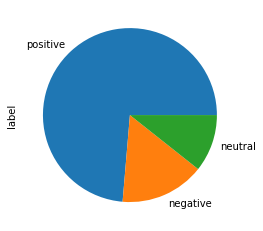

In [ ]:
Reviews['label'].value_counts().plot.pie()

our dataset still is imbalanced. so make it balanced by using Oversampling techniques named SMOTE and Random Oversampling

**Synthetic Minority Oversampling TEchnique(SMOTE)**

SMOTE is an oversampling approach that relies on the concept of nearest neighbors ,in which the minority class is oversampled by creating synthetic examples rather than by oversampling with replacement



In [ ]:
!sudo pip install imbalanced-learn

In [ ]:
import imblearn

In [ ]:
from imblearn.over_sampling import SMOTE

**SMOTE-TFIDF**

In [ ]:
sm=SMOTE(sampling_strategy="all")
labels=Reviews['label'].tolist()
x,y=sm.fit_resample(tfidf_data,labels)
from sklearn.model_selection import train_test_split
# Splitting the data into train data and test data
x_train, x_test, y_train, y_test = train_test_split(x,y, test_size = 0.20, random_state = 1)  

In [ ]:
print(x.shape,y.shape)

(45279, 976228) (45279,)


In [ ]:
print(positive.shape,negative.shape,neutral.shape)

(15093, 2) (3214, 2) (2184, 2)


In [ ]:
x_train.shape

(36223, 975757)

In [ ]:
x_test.shape

(9056, 975757)

In [ ]:
y_train.shape

(36223,)

In [ ]:
y_test.shape

(9056,)

In [ ]:
from collections import Counter
print('Original dataset shape {}'.format(Counter(labels)))

Original dataset shape Counter({'positive': 15093, 'negative': 3214, 'neutral': 2184})


In [ ]:
print('Original dataset shape {}'.format(Counter(y)))

Original dataset shape Counter({'positive': 15093, 'negative': 15093, 'neutral': 15093})


**BOOSTING-SMOTE**

In [ ]:
from xgboost import XGBClassifier
xgb_sm=XGBClassifier()

In [ ]:
xgb_sm.fit(x_train,y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='multi:softprob', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

In [ ]:
y_trainsm_pred = xgb_sm.predict(x_train)
print(y_trainsm_pred)

['neutral' 'negative' 'neutral' ... 'positive' 'positive' 'positive']


In [ ]:
#train accuracy
from sklearn.metrics import accuracy_score
print('Accuracy = ','%.2f'%(accuracy_score(y_train, y_trainsm_pred)*100))

Accuracy =  73.36


In [ ]:
y_testsm_pred = xgb_sm.predict(x_test)
print(y_testsm_pred)

['positive' 'negative' 'neutral' ... 'positive' 'negative' 'negative']


In [ ]:
#test accuracy
from sklearn.metrics import accuracy_score
print('Accuracy = ','%.2f'%(accuracy_score(y_test, y_testsm_pred)*100))

Accuracy =  72.67


In [ ]:
#Classification Report
from sklearn.metrics import classification_report
Report=classification_report(y_test,y_testsm_pred)
print(Report)        

              precision    recall  f1-score   support

    negative       0.80      0.63      0.71      3011
     neutral       0.76      0.68      0.72      3024
    positive       0.66      0.87      0.75      3021

    accuracy                           0.73      9056
   macro avg       0.74      0.73      0.72      9056
weighted avg       0.74      0.73      0.72      9056



**RANDOMFOREST-SMOTE**

In [ ]:
from sklearn.ensemble import RandomForestClassifier
CLF=RandomForestClassifier(n_estimators=100,criterion='entropy')

In [ ]:
##Train the model
CLF.fit(x_train,y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='entropy', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [ ]:
y_clfsmtrain_pred=CLF.predict(x_train)
y_clfsmtest_pred=CLF.predict(x_test)

In [ ]:
# Computation of the evaluation scores
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix
print('Accuracy = ','%.2f'%(accuracy_score(y_train,y_clfsmtrain_pred)*100))    

Accuracy =  100.00


In [ ]:
print('Accuracy = ','%.2f'%(accuracy_score(y_test,y_clfsmtest_pred)*100))    

Accuracy =  96.41


In [ ]:
import pickle

In [ ]:
with open('CLF_pickle','wb') as f:
  pickle.dump(CLF,f)

In [ ]:
with open('CLF_pickle','rb') as f:
  CLF=pickle.load(f)

In [ ]:
!pip install pyyaml h5py 

In [ ]:
import os

import tensorflow as tf
from tensorflow import keras

print(tf.version.VERSION)

In [ ]:

#Classification Report
from sklearn.metrics import classification_report
Report=classification_report(y_test,y_clfsmtest_pred)
print(Report)        

              precision    recall  f1-score   support

    negative       0.99      0.94      0.97      3011
     neutral       1.00      0.95      0.98      3024
    positive       0.90      0.99      0.95      3021

    accuracy                           0.96      9056
   macro avg       0.97      0.96      0.96      9056
weighted avg       0.97      0.96      0.96      9056



**LOGISTIC REGRESSION-SMOTE**

In [ ]:
#train the model
from sklearn.linear_model import LogisticRegression
Lr_sm = LogisticRegression()
Lr_sm.fit(x_train,y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [ ]:
y_Lrsmtrain_pred=Lr_sm.predict(x_train)
y_Lrsmtest_pred=Lr_sm.predict(x_test)

In [ ]:
#Evaluation of model
print('Accuracy = ','%.2f'%(accuracy_score(y_train,y_Lrsmtrain_pred)*100))   

Accuracy =  99.94


In [ ]:
#Evaluation of model
print('Accuracy = ','%.2f'%(accuracy_score(y_test,y_Lrsmtest_pred)*100))     

Accuracy =  98.40


In [ ]:
#Classification Report
from sklearn.metrics import classification_report
Report=classification_report(y_test,y_Lrsmtest_pred)
print(Report)      

              precision    recall  f1-score   support

    negative       0.98      0.99      0.99      3011
     neutral       0.99      0.99      0.99      3024
    positive       0.98      0.97      0.98      3021

    accuracy                           0.98      9056
   macro avg       0.98      0.98      0.98      9056
weighted avg       0.98      0.98      0.98      9056



In [ ]:
import pickle

In [ ]:
with open('Lr_sm_pickle','wb') as f:
  pickle.dump(Lr_sm,f)

In [ ]:
with open('Lr_sm_pickle','rb') as f:
  Lr_sm=pickle.load(f)

**Decision Tree-SMOTE**

In [ ]:
from sklearn import tree
DT_smmodel= tree.DecisionTreeClassifier()
DT_smmodel.fit(x_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [ ]:
y_DTsmtrain_pred=DT_smmodel.predict(x_train)
y_DTsmtest_pred=DT_smmodel.predict(x_test)

In [ ]:
print('Accuracy = ','%.2f'%(accuracy_score(y_train,y_DTsmtrain_pred)*100)) 

Accuracy =  100.00


In [ ]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix
print('Accuracy = ','%.2f'%(accuracy_score(y_test,y_DTsmtest_pred)*100))   

Accuracy =  84.76


In [ ]:
#Classification Report
from sklearn.metrics import classification_report
Report=classification_report(y_test,y_DTsmtest_pred)
print(Report)      

              precision    recall  f1-score   support

    negative       0.85      0.86      0.86      3011
     neutral       0.86      0.87      0.87      3024
    positive       0.83      0.81      0.82      3021

    accuracy                           0.85      9056
   macro avg       0.85      0.85      0.85      9056
weighted avg       0.85      0.85      0.85      9056



**KNN-SMOTE**

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
knn_smmodel= KNeighborsClassifier(n_neighbors=5)
knn_smmodel.fit(x_train, y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                     weights='uniform')

In [ ]:
y_knn_smtrain_pred=knn_smmodel.predict(x_train)
y_knn_smtest_pred=knn_smmodel.predict(x_test)

In [ ]:
print('Accuracy = ','%.2f'%(accuracy_score(y_train,y_knn_smtrain_pred)*100))

Accuracy =  66.47


In [ ]:
print('Accuracy = ','%.2f'%(accuracy_score(y_test,y_knn_smtest_pred)*100))   #overfitted

Accuracy =  65.93


In [ ]:
#Classification Report
from sklearn.metrics import classification_report
Report=classification_report(y_test,y_knn_smtest_pred)
print(Report)      

              precision    recall  f1-score   support

    negative       0.79      0.98      0.88      3011
     neutral       0.57      1.00      0.72      3024
    positive       0.00      0.00      0.00      3021

    accuracy                           0.66      9056
   macro avg       0.45      0.66      0.53      9056
weighted avg       0.45      0.66      0.53      9056



/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


**WORD EMBEDDING**

Word2Vec Model (Training Model)
Word2vec is one of the most popular technique to learn Word embedding(Word embedding is the vector representation of a particular word).Input of word2vec is a text corpus and its output is a set of vectors

Here each word is represented as a vector of 32 or more dimensions instead of a single number. Most interralated words present near to other.# word2vec expects a list of lists.
gensim library hasWord2Vec
output=|V|*D       |V| is size of the vocabulary and D is number of dimensions used to represent each word vector


In [ ]:
#build the word2vec model 
from gensim.models import Word2Vec
wvmodel = Word2Vec(sentences=data,size=100, window=5,min_count=1)
wvmodel.save("word2vec.model")

In [ ]:
#the total number of words in the vocabolary created from this dataset
wvmodel.wv.syn0.shape

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: DeprecationWarning: Call to deprecated `syn0` (Attribute will be removed in 4.0.0, use self.wv.vectors instead).
  


(77569, 100)

In [ ]:
words=wvmodel.wv.vocab
words


In [ ]:
vector=wvmodel.wv["room"]      #converting word to vectors
vector   #Vectors of word room

#############################we can only get the vectors of the words of the corpus.

In [ ]:
#find similar words related to room
similar=wvmodel.wv.most_similar("room")
similar

/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


[('rooms', 0.8439152240753174),
 ('suite', 0.6957266330718994),
 ('roomthe', 0.6935198307037354),
 ('double', 0.6851575374603271),
 ('waitspacious', 0.6648595929145813),
 ('king', 0.6505165100097656),
 ('balcony', 0.6415399312973022),
 ('involvedwe', 0.6409229040145874),
 ('requested', 0.6403142213821411),
 ('dutyspa', 0.6355545520782471)]

In [ ]:
#find similar words related to room
similar=wvmodel.wv.most_similar("resort")
similar

In [ ]:
#find similar words related to room
similar=wvmodel.wv.most_similar("restaurant")
similar

In [ ]:
vector=wvmodel.wv["staff"]
vector  
#find similar words related to room
similar=wvmodel.wv.most_similar("staff")
similar
##the Word2Vec gensim implementation provides a cool method named most_similar.
# Given a word, this method returns the top n similar ones

In [ ]:
vector=wvmodel.wv["good"]
vector  
#find similar words related to room
similar=wvmodel.wv.most_similar("good")
similar

/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


[('decent', 0.8246243000030518),
 ('great', 0.817851185798645),
 ('excellent', 0.7956101298332214),
 ('ok', 0.7360042333602905),
 ('terrific', 0.7250450849533081),
 ('fine', 0.709755539894104),
 ('centralish', 0.7048068642616272),
 ('okay', 0.693530797958374),
 ('fantastic', 0.6762988567352295),
 ('entertainedi', 0.6761243343353271)]

############# The word "room" is associated with some words like [suite,double,king,given,balcony,requested etc]
#############For a given word, we get similar surrounding words of same context. Basically these words have a probability to be closer to that given word in most of the reviews.

In [ ]:
from sklearn.manifold import TSNE
def tsne_plot(model):
    "Creates and TSNE model and plots it"
    labels = []
    tokens = []

    for word in wvmodel.wv.vocab:
        tokens.append(wvmodel[word])
        labels.append(word)
    
    tsne_model = TSNE(perplexity=40, n_components=2, init='pca', n_iter=2500, random_state=23)
    new_values = tsne_model.fit_transform(tokens)

    x = []
    y = []
    for value in new_values:
        x.append(value[0])
        y.append(value[1])
        
    plt.figure(figsize=(16, 16)) 
    for i in range(len(x)):
        plt.scatter(x[i],y[i])
        plt.annotate(labels[i],
                     xy=(x[i], y[i]),
                     xytext=(5, 2),
                     textcoords='offset points',
                     ha='right',
                     va='bottom')
    plt.show()

In [ ]:
#tsne_plot(wvmodel)   

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:8: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  


In [ ]:
# Creating the input data(creating vectors)
X = np.zeros((len(data),100)) #Initializing the X matrix with zeros
for i in range(len(data)):
   emb = [wvmodel.wv[w] for w in data[i]] #Create a list of word embeddings of the words in each sentence
   X[i] = np.sum(emb, axis=0)


In [ ]:
print(X)

TRAIN TEST SPLIT

In [ ]:
from sklearn.model_selection import train_test_split
# Splitting the data into train data and test data
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.20, random_state = 1)     #y list of Rating

In [ ]:
np.shape(X_train)


(16392, 100)

In [ ]:
np.shape(y_train)

(16392,)

In [ ]:
np.shape(X_test)

(4099, 100)

In [ ]:
np.shape(y_test)

(4099,)

In [ ]:
X_train[:5]

Classification


Train the model

***Classification* using Naive Bayes algorithm**



In [ ]:
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix
clf = GaussianNB() # Initializing the classifier
clf.fit(X_train, y_train) # Train the classifier using X_train and y_train

GaussianNB(priors=None, var_smoothing=1e-09)

In [ ]:
#predict the training model
y_pred_train = clf.predict(X_train)
print(y_pred_train)

['positive' 'positive' 'positive' ... 'positive' 'positive' 'positive']


In [ ]:
#train accuracy
print('Accuracy = ','%.2f'%(accuracy_score(y_train, y_pred_train)*100))

Accuracy =  70.99


In [ ]:
# Predict the class label for the test data using the trained model
y_pred = clf.predict(X_test)
print(y_pred)

['positive' 'negative' 'positive' ... 'positive' 'positive' 'positive']


In [ ]:
# Computation of the evaluation scores
print('Accuracy = ','%.2f'%(accuracy_score(y_test, y_pred)*100))
print('Precision = ','%.4f'%(precision_score(y_test, y_pred, average='macro')))
print('Recall = ','%.4f'%(recall_score(y_test, y_pred, average='macro')))
print('F1-score = ','%.4f'%(f1_score(y_test, y_pred, average='macro')))

Accuracy =  71.29
Precision =  0.5306
Recall =  0.4762
F1-score =  0.4945


In [ ]:
##Confusion Matrix
matrix=confusion_matrix(y_test, y_pred)
print(matrix)     

[[ 189   45  415]
 [  39   61  308]
 [ 100  345 2597]]


In [ ]:
#Classification Report
from sklearn.metrics import classification_report
report=classification_report(y_test, y_pred)
print(report)


              precision    recall  f1-score   support

    negative       0.64      0.41      0.50       649
     neutral       0.15      0.17      0.16       408
    positive       0.80      0.85      0.83      3042

    accuracy                           0.71      4099
   macro avg       0.53      0.48      0.49      4099
weighted avg       0.71      0.71      0.71      4099



**Train the model- Random Forest Classifier**


In [ ]:
from sklearn.ensemble import RandomForestClassifier
classifier = RandomForestClassifier(n_estimators=200, random_state=0,criterion='entropy')
classifier.fit(X_train, y_train) 

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='entropy', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=200,
                       n_jobs=None, oob_score=False, random_state=0, verbose=0,
                       warm_start=False)

In [ ]:
#predict the training model
y_predict_train = classifier.predict(X_train)
print(y_predict_train)

['negative' 'positive' 'neutral' ... 'positive' 'positive' 'positive']


In [ ]:
##training accuracy
print('Accuracy = ','%.2f'%(accuracy_score(y_train, y_predict_train)*100))

Accuracy =  100.00


In [ ]:
# Predict the class label for the test data using the trained model
y_predict = classifier.predict(X_test)
print(y_predict)

['positive' 'negative' 'positive' ... 'positive' 'positive' 'positive']


In [ ]:
print('Accuracy = ','%.2f'%(accuracy_score(y_test, y_predict)*100))

Accuracy =  82.95


In [ ]:
#Classification Report
from sklearn.metrics import classification_report
Report=classification_report(y_test, y_predict)
print(Report)


              precision    recall  f1-score   support

    negative       0.74      0.67      0.71       649
     neutral       0.40      0.00      0.01       408
    positive       0.84      0.97      0.90      3042

    accuracy                           0.83      4099
   macro avg       0.66      0.55      0.54      4099
weighted avg       0.78      0.83      0.78      4099



In [ ]:
##Confusion Matrix
Matrix=confusion_matrix(y_test, y_predict)
print(matrix)     ###Confusion matrix shows dataset is imbalanced

[[ 189   45  415]
 [  39   61  308]
 [ 100  345 2597]]


**Train Model using Logistic Regression**


In [ ]:
from sklearn.linear_model import LogisticRegression
Lr_model=LogisticRegression()
Lr_model.fit(X_train,y_train)

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [ ]:
# Predict the class label for the test data using the trained model
y_predtrain_lr = Lr_model.predict(X_train)
print(y_predtrain_lr)

['negative' 'positive' 'positive' ... 'negative' 'positive' 'positive']


In [ ]:
#training accuracy
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix
print('Accuracy = ','%.2f'%(accuracy_score(y_train,y_predtrain_lr)*100))

Accuracy =  83.80


In [ ]:
# Predict the class label for the test data using the trained model
y_pred_lr = Lr_model.predict(X_test)
print(y_pred_lr)

['positive' 'positive' 'positive' ... 'positive' 'positive' 'negative']


In [ ]:
#Classification Report
from sklearn.metrics import classification_report
Report_lr=classification_report(y_test, y_pred_lr)
print(Report_lr)

              precision    recall  f1-score   support

    negative       0.74      0.73      0.74       649
     neutral       0.33      0.15      0.21       408
    positive       0.88      0.95      0.92      3042

    accuracy                           0.84      4099
   macro avg       0.65      0.61      0.62      4099
weighted avg       0.81      0.84      0.82      4099



In [ ]:
##Confusion Matrix
Matrix=confusion_matrix(y_test, y_pred_lr)
print(Matrix)  

[[ 474   54  121]
 [  89   62  257]
 [  75   74 2893]]


**XGB -BOOSTING**

In [ ]:
from xgboost import XGBClassifier
xgb_modelwv=XGBClassifier()

In [ ]:
xgb_modelwv.fit(X_train,y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='multi:softprob', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

In [ ]:
# Predict the class label for the test data using the trained model
y_predxgwv_train = xgb_modelwv.predict(X_train)
print(y_predxgwv_train)
print('Accuracy = ','%.2f'%(accuracy_score(y_train,y_predxgwv_train)*100))

['negative' 'positive' 'positive' ... 'positive' 'positive' 'positive']
Accuracy =  84.10


In [ ]:
y_predxgwv=xgb_modelwv.predict(X_test)
y_predxgwv

array(['positive', 'negative', 'positive', ..., 'positive', 'positive',
       'positive'], dtype='<U8')

In [ ]:
#Classification Report
from sklearn.metrics import classification_report
Report=classification_report(y_test,y_predxgwv)
print(Report) 

              precision    recall  f1-score   support

    negative       0.72      0.73      0.72       649
     neutral       0.41      0.06      0.10       408
    positive       0.86      0.96      0.91      3042

    accuracy                           0.84      4099
   macro avg       0.67      0.58      0.58      4099
weighted avg       0.80      0.84      0.80      4099



**DECISION TREE**

In [ ]:
from sklearn import tree
DTmodel= tree.DecisionTreeClassifier()
DTmodel.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [ ]:
y_preDT_train=DTmodel.predict(X_train)
y_preDT_train

array(['negative', 'positive', 'neutral', ..., 'positive', 'positive',
       'positive'], dtype='<U8')

In [ ]:
print('Accuracy = ','%.2f'%(accuracy_score(y_train,y_preDT_train)*100))

Accuracy =  100.00


In [ ]:
y_preDT=DTmodel.predict(X_test)
y_preDT

array(['neutral', 'negative', 'positive', ..., 'positive', 'positive',
       'neutral'], dtype='<U8')

In [ ]:
#Classification Report
from sklearn.metrics import classification_report
Report=classification_report(y_test,y_preDT)
print(Report)                  #overfitted

              precision    recall  f1-score   support

    negative       0.53      0.54      0.54       649
     neutral       0.14      0.16      0.15       408
    positive       0.85      0.83      0.84      3042

    accuracy                           0.72      4099
   macro avg       0.51      0.51      0.51      4099
weighted avg       0.73      0.72      0.72      4099



**KNN**

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
knnmodel= KNeighborsClassifier(n_neighbors=5)
knnmodel.fit(X_train, y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                     weights='uniform')

In [ ]:
y_Predknn_train=knnmodel.predict(X_train)
y_Predknn_train

array(['negative', 'positive', 'neutral', ..., 'positive', 'positive',
       'positive'], dtype='<U8')

In [ ]:
print('Accuracy = ','%.2f'%(accuracy_score(y_train,y_Predknn_train)*100))

Accuracy =  84.85


In [ ]:
y_Predknn=knnmodel.predict(X_test)
y_Predknn

array(['positive', 'positive', 'positive', ..., 'positive', 'positive',
       'positive'], dtype='<U8')

In [ ]:
#Classification Report
from sklearn.metrics import classification_report
Report=classification_report(y_test,y_Predknn)
print(Report)                             #overfitted

              precision    recall  f1-score   support

    negative       0.66      0.65      0.65       649
     neutral       0.23      0.10      0.14       408
    positive       0.86      0.93      0.90      3042

    accuracy                           0.80      4099
   macro avg       0.58      0.56      0.56      4099
weighted avg       0.77      0.80      0.78      4099



**SUPPORT VECTOR MACHINE**


Model Building- Support Vector Machine

In [ ]:
#Import svm model
from sklearn import svm

In [ ]:
#Create a svm Classifier
svm=svm.SVC(kernel='linear') # Linear Kernel


In [ ]:
svm.fit(X_train,y_train)

KeyboardInterrupt: ignored

In [ ]:
y_pred = SVM.predict(X_test)

In [ ]:
#Classification Report
from sklearn.metrics import classification_report
report_svm=classification_report(y_test, y_pred)
print(report_svm)

**RESAMPLING-SMOTE-WORD2VEC MODELS* 



In [ ]:
sm=SMOTE(sampling_strategy="all")
x_sm,y_sm=sm.fit_resample(X_train,y_train)

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


In [ ]:
print(x_sm.shape,y_sm.shape)

(36153, 100) (36153,)


In [ ]:
from sklearn.model_selection import train_test_split
# Splitting the data into train data and test data
x_trainwv, x_testwv, y_trainwv, y_testwv = train_test_split(x_sm,y_sm, test_size = 0.20, random_state = 1)  

**NB-SMOTE**

In [ ]:
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix
NB_SM = GaussianNB() # Initializing the classifier
NB_SM.fit(x_trainwv, y_trainwv) # Train the classifier

GaussianNB(priors=None, var_smoothing=1e-09)

In [ ]:
y_trainwv_pred = NB_SM.predict(x_trainwv)
y_testwv_pred = NB_SM.predict(x_testwv)


In [ ]:
print('Accuracy = ','%.2f'%(accuracy_score(y_trainwv, y_trainwv_pred)*100))

Accuracy =  47.65


In [ ]:
print('Accuracy = ','%.2f'%(accuracy_score(y_testwv, y_testwv_pred)*100))

Accuracy =  48.43


**RF-WV-SMOTE**

In [ ]:
from sklearn.ensemble import RandomForestClassifier
RF_SM=RandomForestClassifier(n_estimators=100,criterion='entropy')
RF_SM.fit(x_trainwv, y_trainwv)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='entropy', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [ ]:
y_trainRF_pred = RF_SM.predict(x_trainwv)
y_testRF_pred = RF_SM.predict(x_testwv)

In [ ]:
print('Accuracy = ','%.2f'%(accuracy_score(y_trainwv, y_trainRF_pred)*100))

Accuracy =  100.00


In [ ]:
print('Accuracy = ','%.2f'%(accuracy_score(y_testwv, y_testRF_pred)*100))   #overfitted

Accuracy =  93.32


**LR-WV-SMOTE**

In [ ]:
#train the model
from sklearn.linear_model import LogisticRegression
Lr_sm_wv = LogisticRegression()
Lr_sm_wv.fit(x_trainwv,y_trainwv)

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [ ]:
y_trainlr_pred=Lr_sm_wv.predict(x_trainwv)
y_testlr_pred=Lr_sm_wv.predict(x_testwv)

In [ ]:
print('Accuracy = ','%.2f'%(accuracy_score(y_trainwv, y_trainlr_pred)*100))

Accuracy =  74.57


In [ ]:
print('Accuracy = ','%.2f'%(accuracy_score(y_testwv,y_testlr_pred)*100))   #overfitted

Accuracy =  74.31


**BOOSTING-WV-SMOTE**

In [ ]:
from xgboost import XGBClassifier
xgbsm_modelwv=XGBClassifier()
xgbsm_modelwv.fit(x_trainwv,y_trainwv)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='multi:softprob', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

In [ ]:
y_trainxgb_pred=xgbsm_modelwv.predict(x_trainwv)
y_testxgb_pred=xgbsm_modelwv.predict(x_testwv)

In [ ]:
print('Accuracy = ','%.2f'%(accuracy_score(y_trainwv, y_trainxgb_pred)*100))

Accuracy =  76.31


In [ ]:
print('Accuracy = ','%.2f'%(accuracy_score(y_testwv, y_testxgb_pred)*100))

Accuracy =  74.80


**DT_WV_SMOTE**

In [ ]:
from sklearn import tree
DTmodel_smwv= tree.DecisionTreeClassifier()
DTmodel_smwv.fit(x_trainwv, y_trainwv)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [ ]:
y_trainDt_pred=DTmodel_smwv.predict(x_trainwv)
y_testDt_pred=DTmodel_smwv.predict(x_testwv)

In [ ]:
print('Accuracy = ','%.2f'%(accuracy_score(y_trainwv, y_trainDt_pred)*100))

Accuracy =  100.00


In [ ]:
print('Accuracy = ','%.2f'%(accuracy_score(y_testwv, y_testDt_pred)*100))

Accuracy =  79.03


**KNN-WV-SMOTE**

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
knnmodel_smwv= KNeighborsClassifier(n_neighbors=5)
knnmodel_smwv.fit(x_trainwv, y_trainwv)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                     weights='uniform')

In [ ]:
y_traiknn_pred=knnmodel_smwv.predict(x_trainwv)
y_testknn_pred=knnmodel_smwv.predict(x_testwv)

In [ ]:
print('Accuracy = ','%.2f'%(accuracy_score(y_trainwv, y_traiknn_pred)*100))

Accuracy =  87.25


In [ ]:
print('Accuracy = ','%.2f'%(accuracy_score(y_testwv, y_testknn_pred)*100))

NameError: ignored